In [1]:
from nickelpipeline.pipelines.reduction import reduce_all
from nickelpipeline.pipelines.astrometry import astrometry_all
from nickelpipeline.pipelines.photometry import photometry_all
from nickelpipeline.pipelines.final_calib import final_calib_all
from nickelpipeline.convenience.graphs import plot_sources

Initialize logger to see output of functions, setting verbosity level to 'DEBUG', 'INFO', 'WARNING', 'ERROR', or 'CRITICAL'. Logs are displayed wherever code is being run (terminal, console, etc.), and 'DEBUG' level logs are always saved to a .log file.

In [2]:
import logging
from nickelpipeline.convenience.log import adjust_global_logger
adjust_global_logger('INFO', __name__)
logger = logging.getLogger(__name__)

To run the astrometry pipeline, you need to create an account on https://nova.astrometry.net/ and grab an API key. This is a randomly generated string tied to your user account; everything you do using this pipeline will be through your account on the Astrometry.net web service (e.g. all image uploads will show up on your web profile).

Your key is available in the My Profile section of the dashboard.

In [3]:
api_key = 'exampleapikey'

Define directory where raw images are stored.

In [4]:
rawdir = 'data_example/raw'

Basic reduction

In [5]:
red_files = reduce_all(rawdir=rawdir, save_inters=True)
reddir = red_files[0].parent.parent

19:03:31 - INFO - ---- reduce_all() called on directory test_data_example\raw
19:03:31 - INFO - 19 raw files extracted from raw directory
19:03:31 - INFO - Saving table of file data to test_data_example\files_table.tbl
19:03:31 - INFO - Manually excluding files with names []
19:03:31 - INFO - Manually excluding files with [] in object name: []
19:03:31 - INFO - Manually excluding files with [] filters: []
19:03:31 - INFO - Automatically excluding files with 'Focus' in object name: []
19:03:31 - INFO - Automatically excluding files already commented out in the table file: []
19:03:31 - INFO - Initializing CCDData objects & removing cosmic rays
19:03:38 - INFO - Combining bias files into master bias
19:03:38 - INFO - Using 10 bias frames: ['d1001', 'd1002', 'd1003', 'd1004', 'd1005', 'd1006', 'd1007', 'd1008', 'd1009', 'd1010']
19:03:39 - INFO - Saving master bias to test_data_example\processing\master_bias.fits
19:03:39 - INFO - Combining flat files into master flat
19:03:39 - INFO - Us

Astrometric calibration

In [6]:
astro_calib_files = astrometry_all(reddir, api_key)

19:03:40 - INFO - ---- astrometry_all() called on directory test_data_example\reduced
19:03:40 - INFO - ---- astrometry_all() call ended
19:03:40 - INFO - Zeroing out masked regions for faster astrometric solves
19:03:40 - INFO - Connecting to astrometry.net
19:03:41 - INFO - Returning local copy of d1052_red.fits's solution; astrometry.net not used
19:03:41 - INFO - Returning local copy of d1048_red.fits's solution; astrometry.net not used
19:03:41 - INFO - Returning local copy of d1059_red.fits's solution; astrometry.net not used
19:03:41 - INFO - Returning local copy of d1047_red.fits's solution; astrometry.net not used
19:03:41 - INFO - Returning local copy of d1083_red.fits's solution; astrometry.net not used
19:03:41 - INFO - Returning local copy of d1074_red.fits's solution; astrometry.net not used


Photometric calibration

In [7]:
src_catalog_paths = photometry_all(reddir, group=False, plot_final=False,
                                   plot_inters=False)

19:03:41 - INFO - ---- photometry_all() called on directory test_data_example\reduced
19:03:42 - INFO - Working on image d1052_red.fits (NGC_3982 - V) (11 stamps)
19:03:43 - INFO - Stack FWHM = 6.499938121481804
19:03:45 - WARNING - One or more fit(s) may not have converged. Please check the "flags" column in the output table.
19:03:45 - INFO - Aperture photometry cannot handle masked pixels--sources with masked pixels have flux_aper = nan


19:03:48 - INFO - Working on image d1048_red.fits (NGC_4147 - V) (57 stamps)
19:03:50 - INFO - Stack FWHM = 6.226742495381551
19:03:59 - WARNING - One or more fit(s) may not have converged. Please check the "flags" column in the output table.
19:03:59 - WARNING - Some groups have more than 25 sources. Fitting such groups may take a long time and be error-prone. You may want to consider using different `SourceGrouper` parameters or changing the "group_id" column in "init_params".
19:03:59 - INFO - Aperture photometry cannot handle masked pixels--sources with masked pixels have flux_aper = nan


19:04:14 - INFO - Working on image d1059_red.fits (NGC_6205 - V) (186 stamps)
19:04:22 - INFO - Clipped Avg FWHM = 6.880937236174258
19:05:14 - WARNING - One or more fit(s) may not have converged. Please check the "flags" column in the output table.
19:05:14 - WARNING - Some groups have more than 25 sources. Fitting such groups may take a long time and be error-prone. You may want to consider using different `SourceGrouper` parameters or changing the "group_id" column in "init_params".
19:05:14 - INFO - Aperture photometry cannot handle masked pixels--sources with masked pixels have flux_aper = nan


19:05:15 - INFO - Working on image d1047_red.fits (PG1323-085 - V) (17 stamps)
19:05:16 - INFO - Stack FWHM = 6.984669812933554
19:05:18 - WARNING - One or more fit(s) may not have converged. Please check the "flags" column in the output table.
19:05:18 - INFO - Aperture photometry cannot handle masked pixels--sources with masked pixels have flux_aper = nan


19:05:19 - INFO - Working on image d1083_red.fits (PG1530+057 - V) (20 stamps)
19:05:20 - INFO - Stack FWHM = 8.183825981182611
19:05:23 - INFO - Aperture photometry cannot handle masked pixels--sources with masked pixels have flux_aper = nan
19:05:24 - INFO - Working on image d1074_red.fits (UGC_9837 - V) (14 stamps)
19:05:25 - INFO - Stack FWHM = 5.809706403374082
19:05:27 - WARNING - One or more fit(s) may not have converged. Please check the "flags" column in the output table.
19:05:27 - INFO - Aperture photometry cannot handle masked pixels--sources with masked pixels have flux_aper = nan
19:05:27 - INFO - ---- photometry_all() call ended


Final calibration (convert pixel coordinates -> RA/Dec)

In [8]:
photodir = src_catalog_paths[0].parent.parent
astrodir = astro_calib_files[0].parent
astrophot_data_tables = final_calib_all(photodir, astrodir)

19:05:27 - INFO - Saving photometric source catalogs with sky coordinates (RA/Dec) to test_data_example\final_calib\astrophotsrcs\NGC_3982_V
19:05:27 - INFO - Saving source catalog with RA/Dec coordinates to test_data_example\final_calib\astrophotsrcs\NGC_3982_V\d1052_astrophotsrcs.csv
19:05:27 - INFO - Saving photometric source catalogs with sky coordinates (RA/Dec) to test_data_example\final_calib\astrophotsrcs\NGC_4147_V
19:05:27 - INFO - Saving source catalog with RA/Dec coordinates to test_data_example\final_calib\astrophotsrcs\NGC_4147_V\d1048_astrophotsrcs.csv
19:05:27 - INFO - Saving photometric source catalogs with sky coordinates (RA/Dec) to test_data_example\final_calib\astrophotsrcs\NGC_6205_V
19:05:28 - INFO - Saving source catalog with RA/Dec coordinates to test_data_example\final_calib\astrophotsrcs\NGC_6205_V\d1059_astrophotsrcs.csv
19:05:28 - INFO - Saving photometric source catalogs with sky coordinates (RA/Dec) to test_data_example\final_calib\astrophotsrcs\PG1323-08

Display images & annotate sources

19:12:40 - INFO - Plotting image d1052_red.fits (NGC_3982 - V)


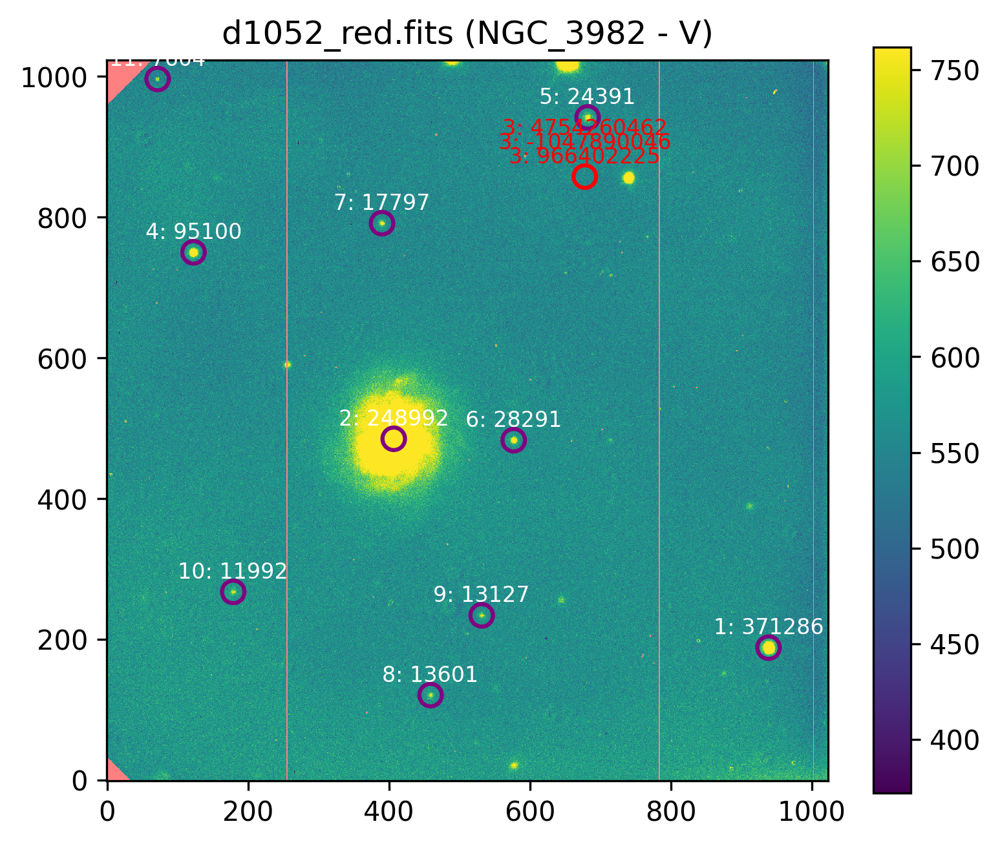

19:12:41 - INFO - Plotting image d1048_red.fits (NGC_4147 - V)


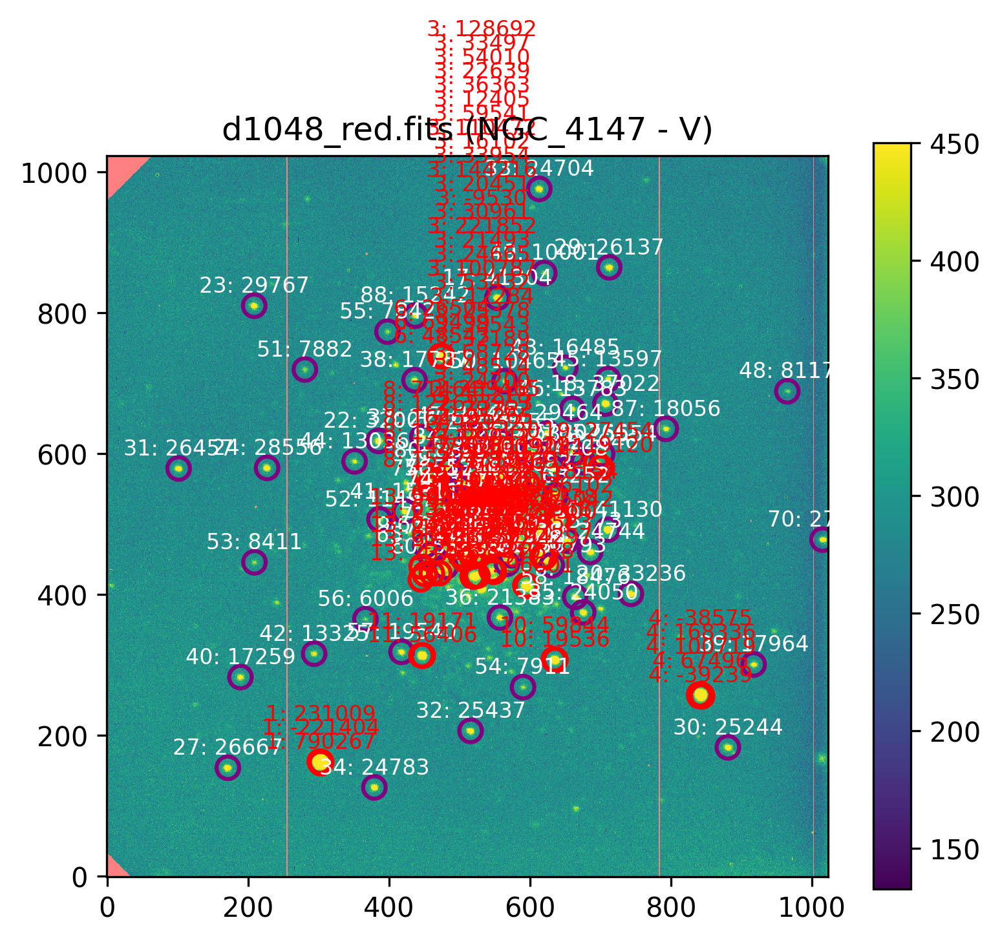

19:12:42 - INFO - Plotting image d1059_red.fits (NGC_6205 - V)


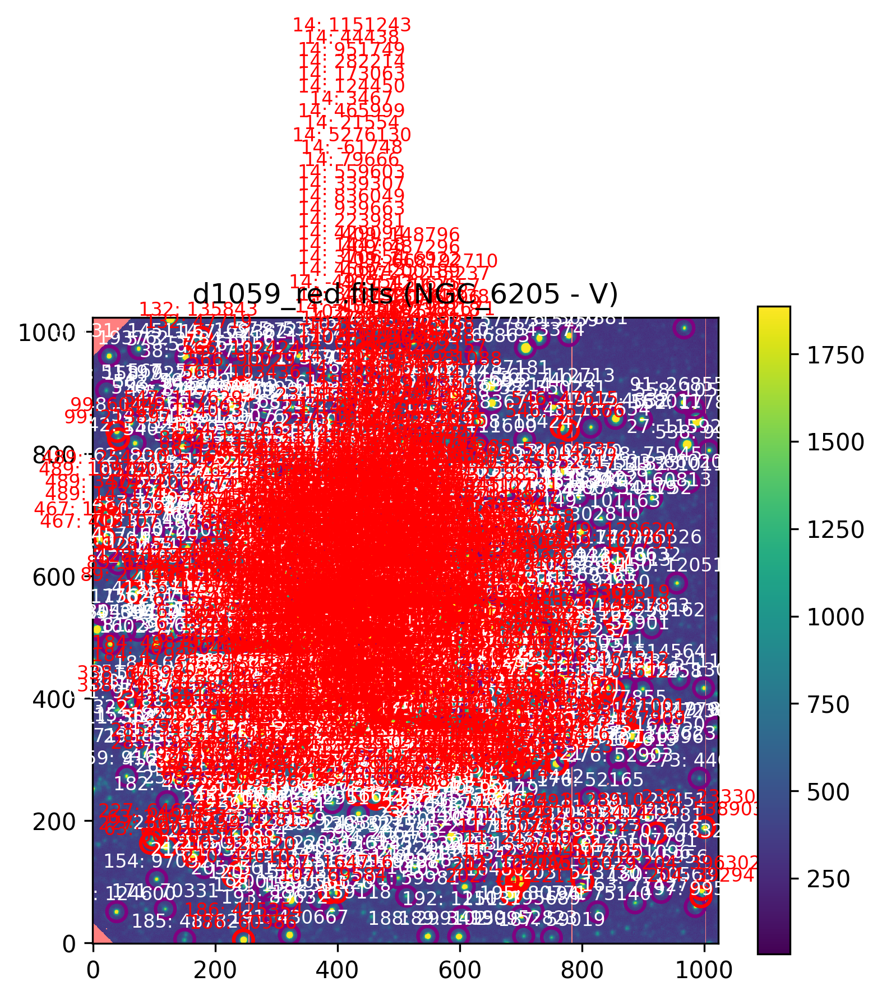

19:12:46 - INFO - Plotting image d1047_red.fits (PG1323-085 - V)


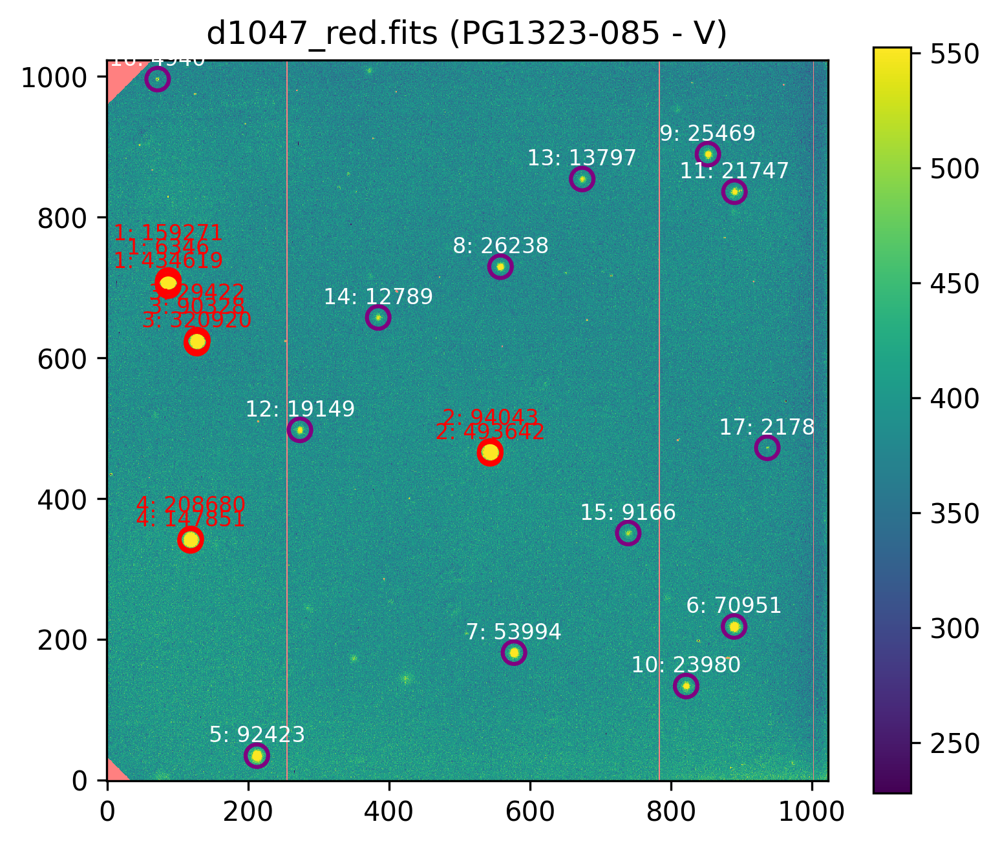

19:12:47 - INFO - Plotting image d1083_red.fits (PG1530+057 - V)


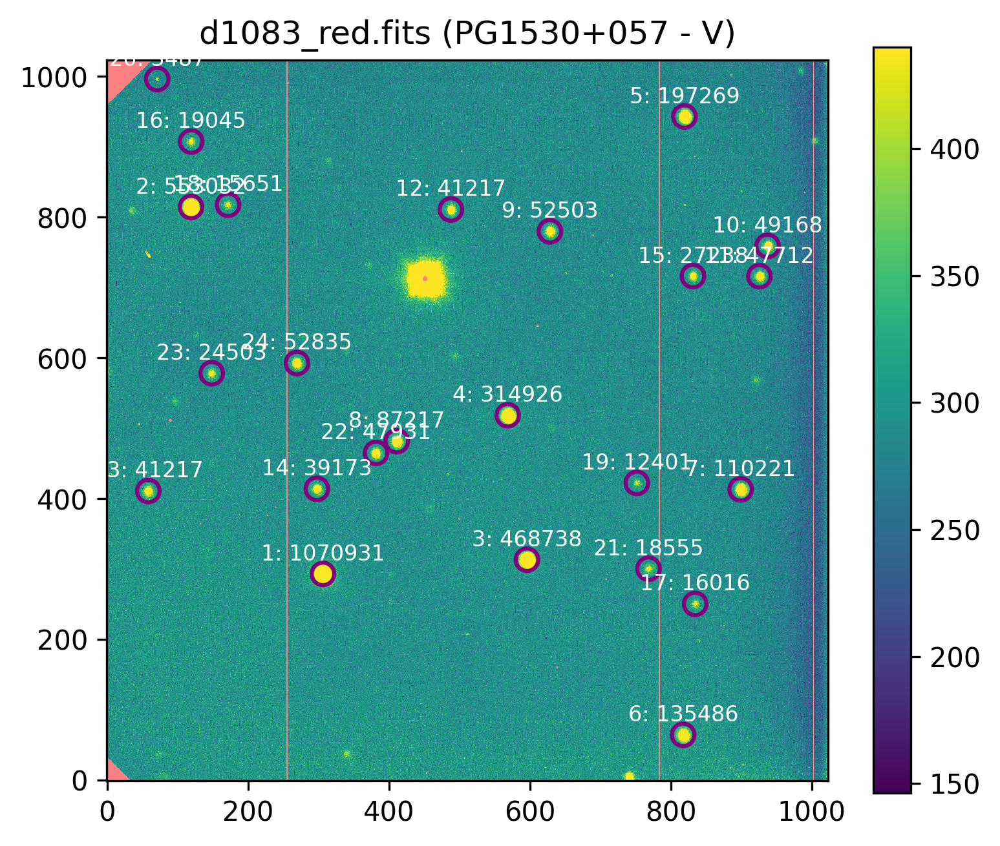

19:12:48 - INFO - Plotting image d1074_red.fits (UGC_9837 - V)


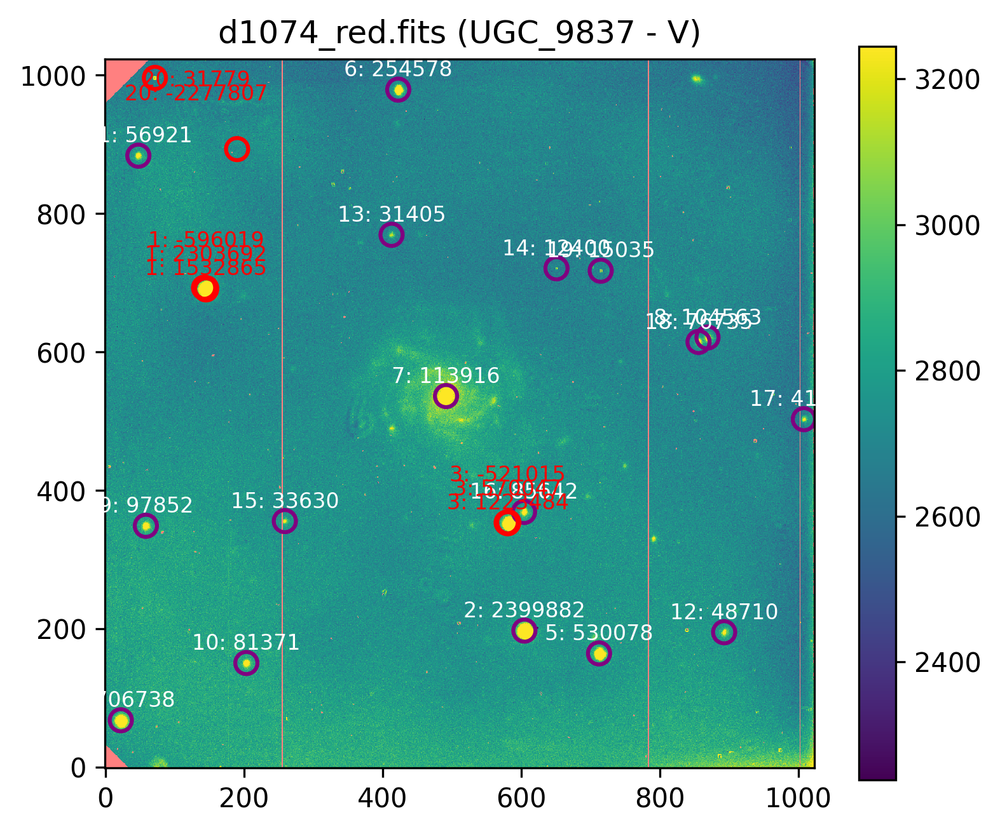

In [10]:
for object, src_table_dict in astrophot_data_tables.items():
    for file_key, src_table in src_table_dict.items():
        plot_sources(src_table, given_fwhm=8.0, flux_name='flux_psf', scale=1)